In [3]:
import pandas as pd
import json
import numpy as np
from pathlib import Path
from PIL import Image
import matplotlib.pyplot as plt
result_dir = Path('results')

sigmas = [0.2, 0.1, 0.01]
methods = ['TV', 'NLM','bilateral', 'Diffusion', 'Guided Diffusion', 'DnCNN']


In [2]:
sigmas = [0.2, 0.1, 0.01]
all_stats=[]
# read stats
for d in result_dir.glob("*"):
    with open(d / 'stats.json') as f:
        stats = json.load(f)
        #print(stats)
        #all_stats.append(stats)
        for sigma in sigmas:
            for method in methods:
                    
                    if str(sigma )in stats and method in stats[str(sigma)]:
                        record = stats[str(sigma)][method]
                        record['method'] = method
                        record['sigma'] = sigma
                        all_stats.append(record)

df = pd.DataFrame(all_stats)
df

,psnr,ssim,method,sigma
0,19.295692,0.319101,TV,0.20
1,20.875206,0.499641,DnCNN,0.20
2,21.308846,0.554968,TV,0.10
3,21.220151,0.555325,DnCNN,0.10
4,21.676256,0.603769,TV,0.01
...,...,...,...,...
419,23.200328,0.533337,DnCNN,0.20
420,23.635739,0.574937,TV,0.10
421,23.765167,0.584766,DnCNN,0.10
422,24.332751,0.635132,TV,0.01


In [10]:
# save stats to csv
df.groupby(['method', 'sigma']).mean().round(2).T.to_csv('results.csv')

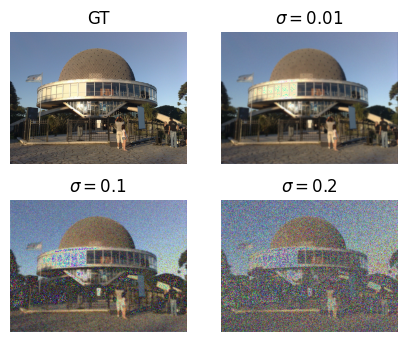

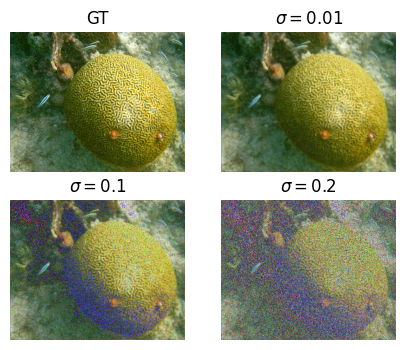

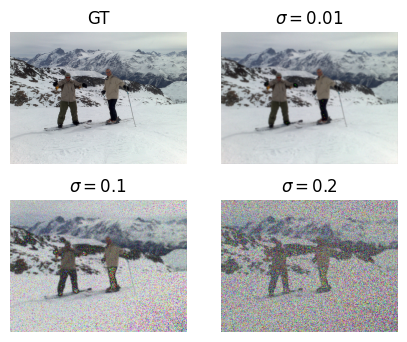

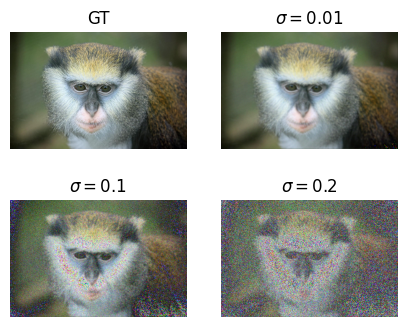

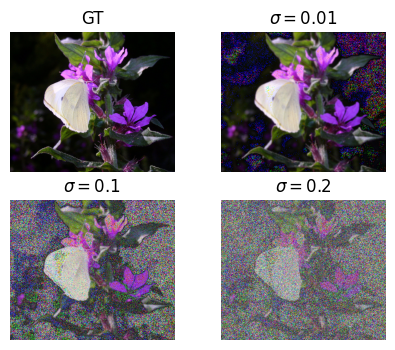

...

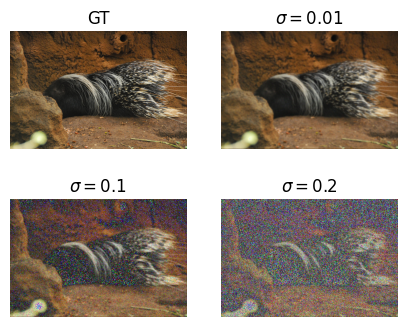

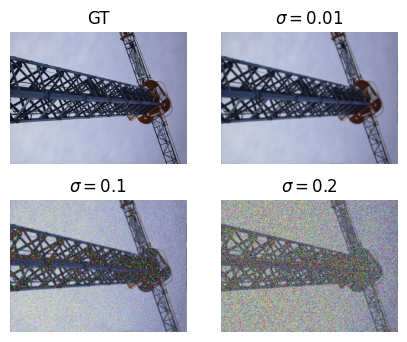

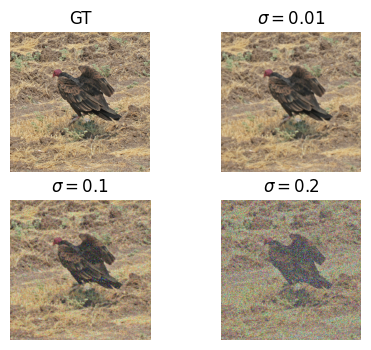

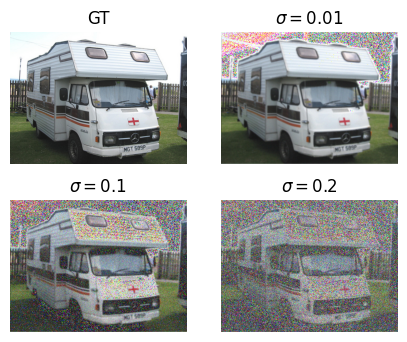

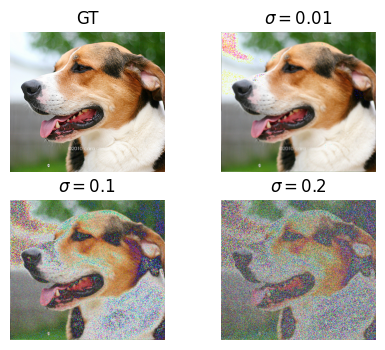

In [33]:
# plot example images
for d in result_dir.glob("*"):
    gt = Image.open(d / 'GT.png')
    fig, ax = plt.subplots(2, 2, figsize=(5, 4))
    i =0
    ax[i,0].imshow(gt)
    ax[i,0].set_title('GT')
    ax[i,0].axis('off')
    i+=1
    for sigma in sorted(sigmas):
        ax[i//2, i%2].imshow(Image.open(d / f'noisy_{sigma}.png'))
        ax[i//2, i%2].set_title(f'$\sigma={sigma}$')
        ax[i//2, i%2].axis('off')
        i+=1
    plt.show()
        




In [4]:
methods

['TV', 'NLM', 'bilateral', 'Diffusion', 'Guided Diffusion', 'DnCNN']

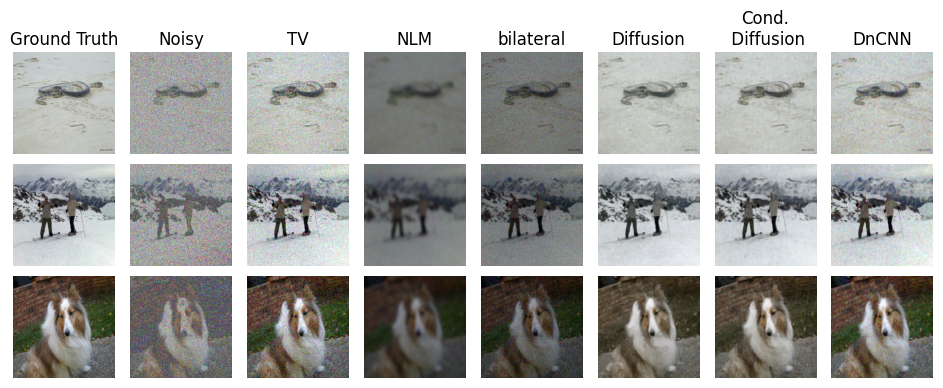

In [30]:
sigma = 0.2
n = len(methods) +2
rows = 3
dirs = sorted(list(result_dir.glob("*")), key=lambda x: int(x.name))[:rows]
fig, ax = plt.subplots(rows, n, figsize=(9.5, 4))
ax[0,0].set_title('Ground Truth')
ax[0,1].set_title('Noisy')
for i, m in enumerate(methods):
    ax[0, i+2].set_title(m.replace("Guided", 'Cond.\n'))
i =0
x= 0
for d in dirs:
    gt = Image.open(d / 'GT.png').resize((256,256))
    

    ax[x, 0].imshow(gt)
    ax[x, 0].axis('off')
    i+=1
    ax[x, 1].imshow(Image.open(d / f'noisy_{sigma}.png').resize((256,256)))
    ax[x, 1].axis('off')
    i+=1
    y =2
    for method in methods:
        ax[x, y].imshow(Image.open(d / f'{method}_{sigma}.png').resize((256,256)))
        ax[x, y].axis('off')
        y+=1
    x+=1
plt.tight_layout()
plt.show()

0 1
0 2
0 3
1 1
1 2
1 3
2 1
2 2
2 3


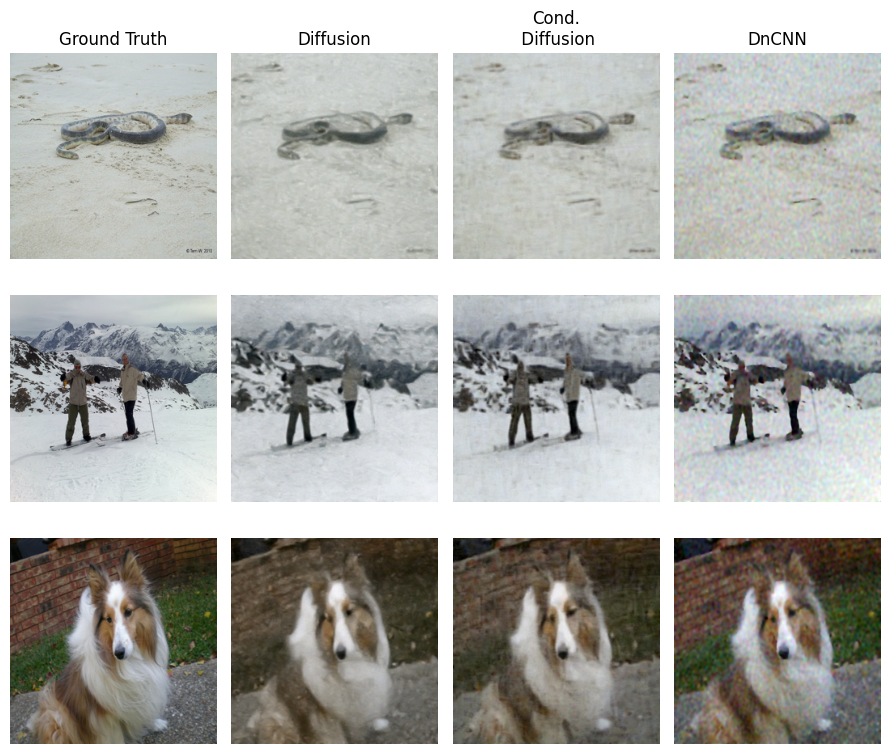

In [12]:
sigma = 0.2
methods_ = methods[-3:]
n = len(methods_) +1
rows = 3
dirs = sorted(list(result_dir.glob("*")), key=lambda x: int(x.name))[:rows]
fig, ax = plt.subplots(rows, n, figsize=(9, 8))
ax[0,0].set_title('Ground Truth')
for i, m in enumerate(methods_):
    ax[0, i+1].set_title(m.replace("Guided", 'Cond.\n'))
i =0
x= 0
for d in dirs:
    gt = Image.open(d / 'GT.png').resize((256,256))
    

    ax[x, 0].imshow(gt)
    ax[x, 0].axis('off')
    i+=1
    y =1
    for method in methods_:
        print(x,y)
        ax[x, y].imshow(Image.open(d / f'{method}_{sigma}.png').resize((256,256)))
        ax[x, y].axis('off')
        y+=1
    x+=1
plt.tight_layout()
plt.show()